In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport

#%matplotlib inline

In [2]:
df = pd.read_csv('Dataset/BankChurners.csv')
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [3]:
# Drop irrelevant columns
df = df.drop(["CLIENTNUM", 
              "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1", 
              "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"
             ], axis=1)
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


### EDA

In [4]:
credit_card_report = ProfileReport(df)
credit_card_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

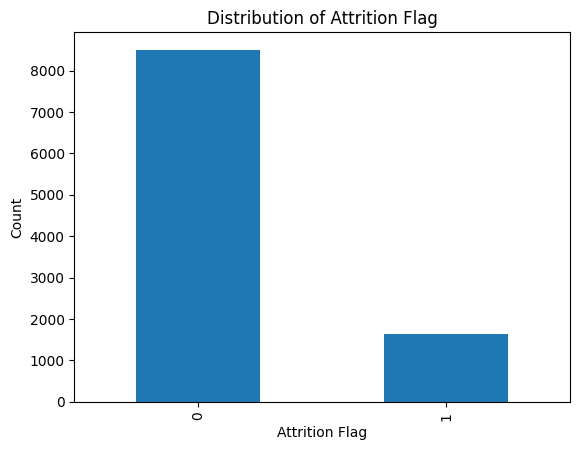

In [19]:
# Distribution of the target variable
df['Attrition_Flag'].value_counts().plot(kind='bar')
plt.xlabel('Attrition Flag')
plt.ylabel('Count')
plt.title('Distribution of Attrition Flag')
plt.show()

Unbalanced dataset may result in a biased model which is better at predicting for the majority class. Since this dataset is unbalanced, we have tried a few strategies: 
1. Class weighting 
2. SMOTE

### Data Preprocessing

In [4]:
# Check missing values
df.isna().sum()

Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

- From the output above and ProfileReport above, there is no NA value. Hence, we do not need to handle missing values. 
- It may be necessary to inspect the 0 values as well, since it maybe used as placeholder for NA value. 
Here are 4 columns with 0 values: Contacts_Count_12_mon (3.9%), Dependent Count (8.9%), Total_Revolving_Balance (24.4%), Avg_Utilization_Ratio (24.4%). Based on domain knowledge, these zero values are reasonable. So we keep them. 
- However, for categorical values, around 11% of 'Income_Category' and 15% of 'Education_Level' are recorded as "Unknown". This proportion is not negligible, so we decided to keep them by imputing with mode. We will impute with mode after train-test split to avoid data leakage.

### Feature Engineering

In [5]:
# Encode categorical values
categorical_columns = df.select_dtypes(exclude=['int64','float64']).columns
categorical_columns

Index(['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category'],
      dtype='object')

In [9]:
# Check the unique values of each categorical column
print(df['Attrition_Flag'].unique())
print(df['Gender'].unique())
print(df['Marital_Status'].unique())
print(df['Card_Category'].unique())
print(df['Education_Level'].unique())
print(df['Income_Category'].unique())

['Existing Customer' 'Attrited Customer']
['M' 'F']
['Married' 'Single' 'Unknown' 'Divorced']
['Blue' 'Gold' 'Silver' 'Platinum']
['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']


In [10]:
# Encode binary features
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Attrited Customer':1, 'Existing Customer':0}) # Target variable
df['Gender'] = df['Gender'].map({'M':1, 'F':0})

# Encode non-ordinal feature
df = pd.get_dummies(df, columns=['Marital_Status'], drop_first=True) # One-hot encode Marital_Status

# Encode ordinal features
df['Card_Category'] = df['Card_Category'].map({'Blue':0, 'Silver':1, 'Gold':2, 'Platinum':3})
df['Education_Level'] = df['Education_Level'].map({'Uneducated':0, 'High School':1, 'College':2, 'Graduate':3, 'Post-Graduate':4, 'Doctorate':5})
df['Income_Category'] = df['Income_Category'].map({'Less than $40K':0, '$40K - $60K':1, '$60K - $80K':2, '$80K - $120K':3, '$120K +':4})

### Modelling

In [11]:
# Train-test split
from sklearn.model_selection import train_test_split

X = df.drop('Attrition_Flag', axis=1)
y = df['Attrition_Flag']

# Split the dataset into training and testing sets with stratified split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42) 

In [ ]:
# Impute 'Unknown' values with the mode of the column
X_train.fillna({'Education_Level': X_train['Education_Level'].mode()[0]}, inplace=True)
X_train.fillna({'Income_Category': X_train['Income_Category'].mode()[0]}, inplace=True)

X_test.fillna({'Education_Level': X_test['Education_Level'].mode()[0]}, inplace=True)
X_test.fillna({'Income_Category': X_test['Income_Category'].mode()[0]}, inplace=True)

Result from experiment: 
- class_weight = "balanced"/ scale_pos_weight=sum(y_train == 0) / sum(y_train == 1)
  - Better for LR, XGBoost;
  - worse for RV
- SMOTE
    - Improve for all 
    - LR XGBoost
- Compare
    - Class_weight comparable to SMOTE (require fine-tuning) for LR, XGBoost
    - SMOTE better for RV


### Model training

For model implementation, we choose Logistic Regression as baseline, Random Forest for a balance between interpretability and performance, and XGBoost for performance. 

For model evaluation, we use a combination of threshold-dependent and threshold-independent metrics. Since the dataset is imbalanced, we choose the following metrics:
- F1 score, recall, precision
- Precision-Recall curve & Area Under Curve (PR-AUC)

In [25]:
from sklearn.metrics import classification_report, f1_score, precision_recall_curve, average_precision_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import shap

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.83      0.89      1701
           1       0.47      0.81      0.60       325

    accuracy                           0.82      2026
   macro avg       0.71      0.82      0.74      2026
weighted avg       0.88      0.82      0.84      2026



/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


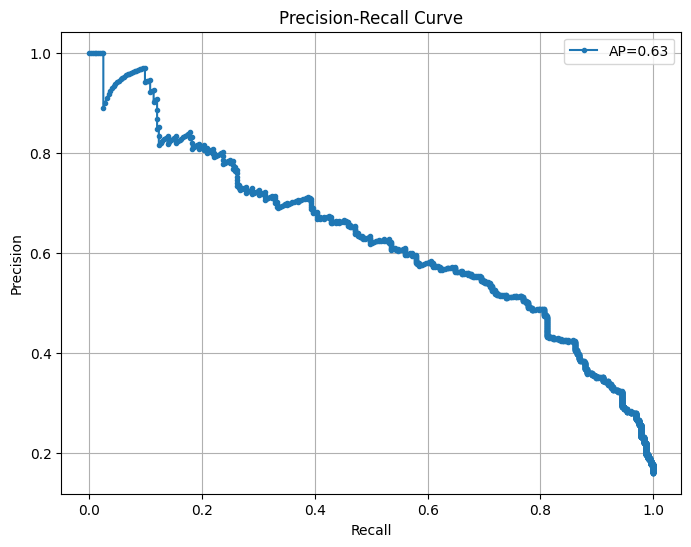

In [ ]:
# Logistic Regression with class_weight='balanced'
lr_model = LogisticRegression(class_weight='balanced')
lr_model.fit(X_train, y_train)

y_pred = lr_model.predict(X_test)
y_prob = lr_model.predict_proba(X_test)[:, 1]

# Model evaluation
print("Classification Report:")
print(classification_report(y_test, y_pred))

precision, recall, _ = precision_recall_curve(y_test, y_prob)
avg_precision = average_precision_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'AP={avg_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      1701
           1       0.93      0.75      0.83       325

    accuracy                           0.95      2026
   macro avg       0.94      0.87      0.90      2026
weighted avg       0.95      0.95      0.95      2026



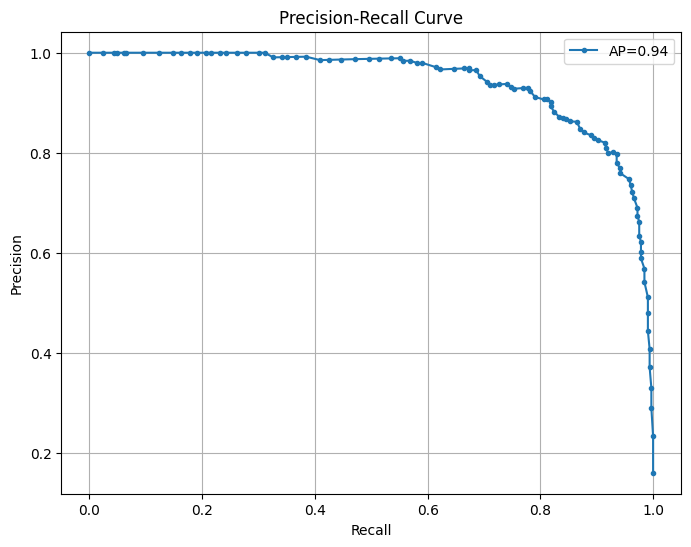

In [23]:
# Random Forest model with class_weight='balanced'
rv_model = RandomForestClassifier(class_weight='balanced')
rv_model.fit(X_train, y_train)

y_pred = rv_model.predict(X_test)
y_prob = rv_model.predict_proba(X_test)[:, 1]

# Model evaluation
print("Classification Report:")
print(classification_report(y_test, y_pred))

precision, recall, _ = precision_recall_curve(y_test, y_prob)
avg_precision = average_precision_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'AP={avg_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1701
           1       0.91      0.89      0.90       325

    accuracy                           0.97      2026
   macro avg       0.95      0.94      0.94      2026
weighted avg       0.97      0.97      0.97      2026



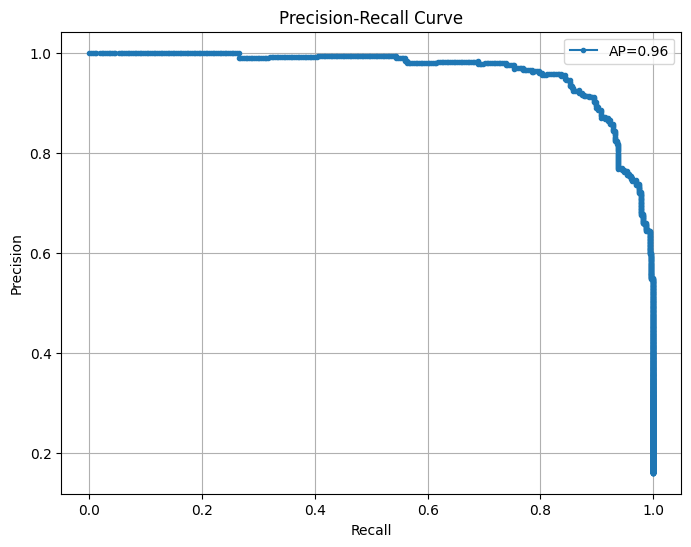

In [22]:
# XGBoost model with scale_pos_weight
xgb_model = XGBClassifier(scale_pos_weight=sum(y_train == 0) / sum(y_train == 1))
xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)
y_prob = xgb_model.predict_proba(X_test)[:, 1]

# Model evaluation
print("Classification Report:")
print(classification_report(y_test, y_pred))

precision, recall, _ = precision_recall_curve(y_test, y_prob)
avg_precision = average_precision_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'AP={avg_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()

Since XGBoost performs best among the three, we tried SMOTE for XGBoost, hoping to boost the model performance.

Ratio: 0.3, F1-score: 0.9076, PR-AUC: 0.9608
Ratio: 0.325, F1-score: 0.8983, PR-AUC: 0.9633
Ratio: 0.35000000000000003, F1-score: 0.9074, PR-AUC: 0.9648
Ratio: 0.37500000000000006, F1-score: 0.8927, PR-AUC: 0.9584
Ratio: 0.4000000000000001, F1-score: 0.9016, PR-AUC: 0.9608
Ratio: 0.4250000000000001, F1-score: 0.8987, PR-AUC: 0.9605
Ratio: 0.4500000000000001, F1-score: 0.9011, PR-AUC: 0.9620
Ratio: 0.47500000000000014, F1-score: 0.9040, PR-AUC: 0.9618
Ratio: 0.5000000000000002, F1-score: 0.9000, PR-AUC: 0.9606
Ratio: 0.5250000000000001, F1-score: 0.9039, PR-AUC: 0.9638
Ratio: 0.5500000000000003, F1-score: 0.8972, PR-AUC: 0.9627
Ratio: 0.5750000000000002, F1-score: 0.9128, PR-AUC: 0.9659
Ratio: 0.6000000000000003, F1-score: 0.8924, PR-AUC: 0.9635
Ratio: 0.6250000000000002, F1-score: 0.8970, PR-AUC: 0.9613
Ratio: 0.6500000000000004, F1-score: 0.9039, PR-AUC: 0.9630
Ratio: 0.6750000000000003, F1-score: 0.8997, PR-AUC: 0.9611
Ratio: 0.7000000000000004, F1-score: 0.9131, PR-AUC: 0.9639


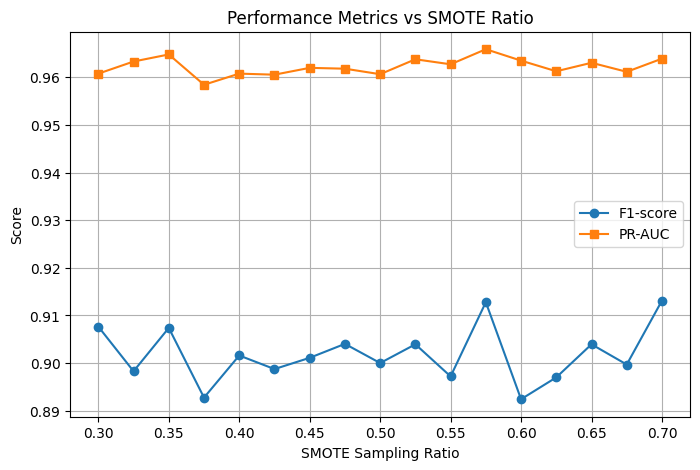

In [30]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE with different ratios
sampling_ratios = np.arange(0.3, 0.71, 0.025)

results = []

for ratio in sampling_ratios:
    # Apply SMOTE with the current ratio
    smote = SMOTE(sampling_strategy=ratio, random_state=42)
    X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

    # Train logistic regression model
    model = XGBClassifier()
    model.fit(X_resampled, y_resampled)

    # Make predictions on the test set
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Calculate evaluation metrics
    f1 = f1_score(y_test, y_pred)
    avg_precision = average_precision_score(y_test, y_prob)

    results.append({'Ratio': ratio, 'F1-score': f1, 'PR-AUC': avg_precision})

    print(f"Ratio: {ratio}, F1-score: {f1:.4f}, PR-AUC: {avg_precision:.4f}")

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Plot the results
plt.figure(figsize=(8, 5))
plt.plot(results_df['Ratio'], results_df['F1-score'], marker='o', label='F1-score')
plt.plot(results_df['Ratio'], results_df['PR-AUC'], marker='s', label='PR-AUC')
plt.xlabel('SMOTE Sampling Ratio')
plt.ylabel('Score')
plt.title('Performance Metrics vs SMOTE Ratio')
plt.legend()
plt.grid(True)
plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.92      0.86      0.89       325

    accuracy                           0.97      2026
   macro avg       0.95      0.92      0.93      2026
weighted avg       0.96      0.97      0.97      2026



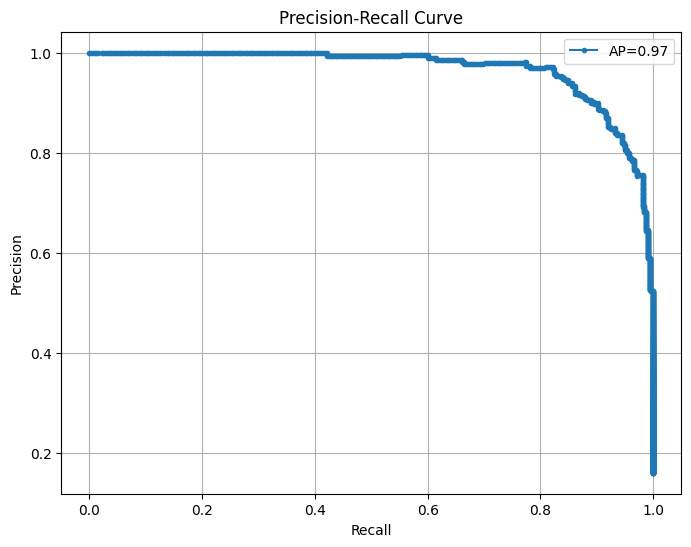

In [57]:
# Final XGBoost model with SMOTE
smote = SMOTE(sampling_strategy=0.6, random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

xgb_model = XGBClassifier()
xgb_model.fit(X_resampled, y_resampled)

y_pred = xgb_model.predict(X_test)
y_prob = xgb_model.predict_proba(X_test)[:, 1]

# Model evaluation
print("Classification Report:")
print(classification_report(y_test, y_pred))

precision, recall, _ = precision_recall_curve(y_test, y_prob)
avg_precision = average_precision_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'AP={avg_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()

### Model Interpretation

Model-specific methods: feature importance for tree-based algorithms

Feature ranking:
1. feature Total_Trans_Ct (0.2751278877258301)
2. feature Total_Relationship_Count (0.11483554542064667)
3. feature Total_Trans_Amt (0.09029363840818405)
4. feature Total_Revolving_Bal (0.08594827353954315)
5. feature Gender (0.07023601233959198)
6. feature Marital_Status_Single (0.05221491679549217)
7. feature Total_Ct_Chng_Q4_Q1 (0.04234056547284126)
8. feature Marital_Status_Married (0.03318490833044052)
9. feature Total_Amt_Chng_Q4_Q1 (0.03170771524310112)
10. feature Months_Inactive_12_mon (0.029056977480649948)
11. feature Card_Category (0.02397584356367588)
12. feature Customer_Age (0.021935103461146355)
13. feature Avg_Open_To_Buy (0.021593142300844193)
14. feature Marital_Status_Unknown (0.021508781239390373)
15. feature Income_Category (0.019439859315752983)
16. feature Contacts_Count_12_mon (0.01794259436428547)
17. feature Credit_Limit (0.014701254665851593)
18. feature Avg_Utilization_Ratio (0.012101943604648113)
19. feature Education_Level (0.009312334470

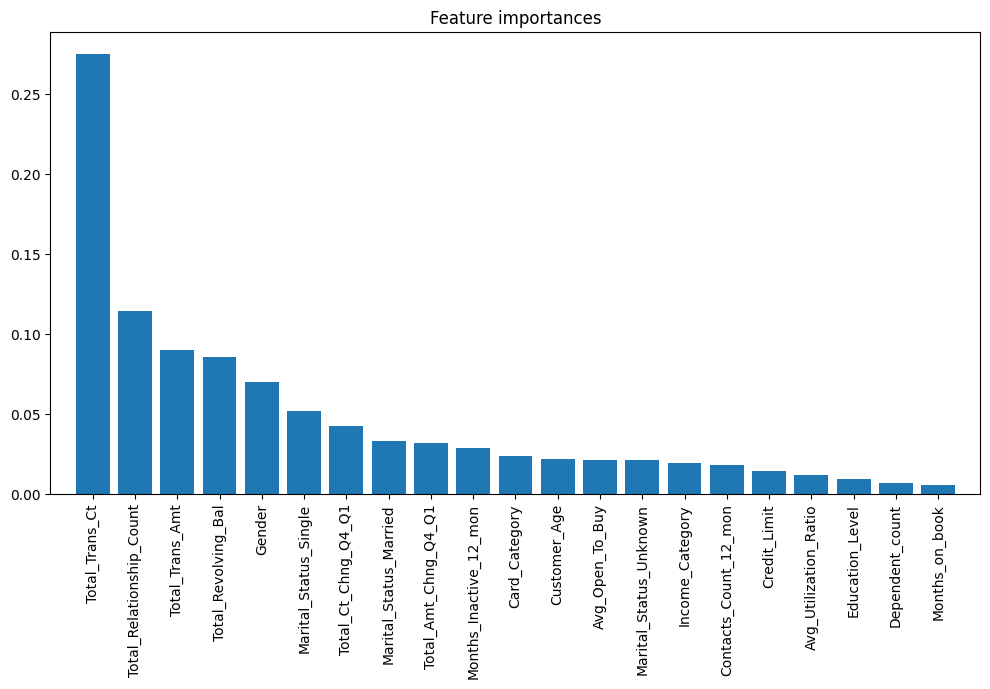

In [ ]:
# Feature importance for XGBoost model
importances = xgb_model.feature_importances_
indices = np.argsort(importances)[::-1]

print("Feature ranking:")
for f in range(X.shape[1]):
    print(f"{f + 1}. feature {X.columns[indices[f]]} ({importances[indices[f]]})")

plt.figure(figsize=(12, 6))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

Model-agnostic methods: SHAP (SHapley Additive exPlanations)

In [50]:
# XGBoost explainer using SHAP
X_train = X_train.astype(float)  # Convert everything to float to avoid errors for SHAP
X_test = X_test.astype(float)

shap.initjs()
explainer = shap.Explainer(xgb_model, X_train)  # Tree-based SHAP explainer for XGBoost
shap_values = explainer(X_test)  # Compute SHAP values for test data
shap_values.shape

(2026, 21)

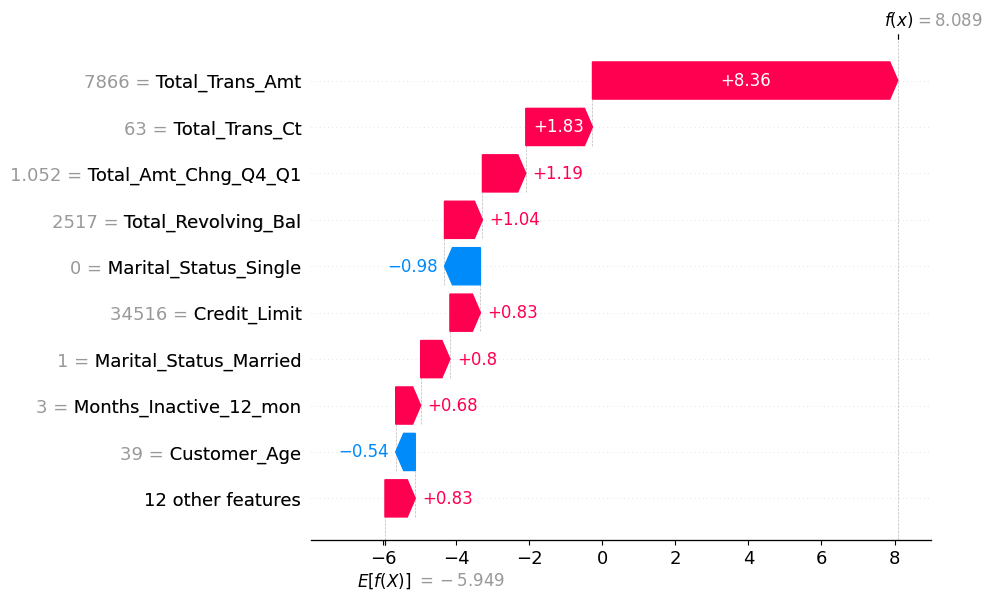

In [51]:
# Sample visualization of a positive class
churn_index = np.where(np.array(y_test) == 1)[0]  # Index of churned customers
shap.plots.waterfall(shap_values[churn_index[1]])

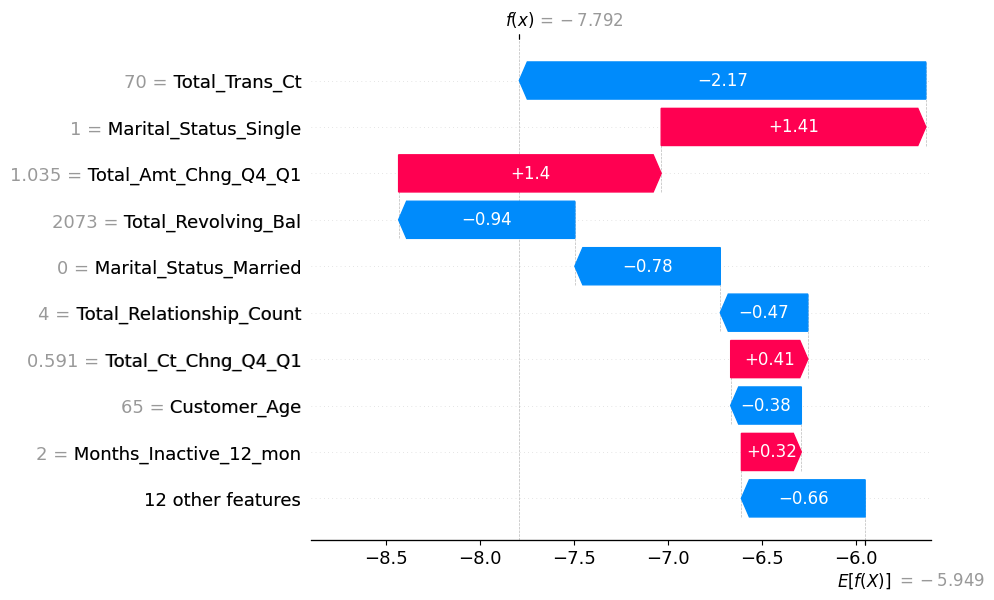

In [ ]:
# Sample visualization of a negative class 
shap.plots.waterfall(shap_values[0])

In [ ]:
# Visualize the same sample with a force plot
shap.plots.force(shap_values[0])

In [54]:
# Visualize all test set predictions
shap.plots.force(shap_values[:500])

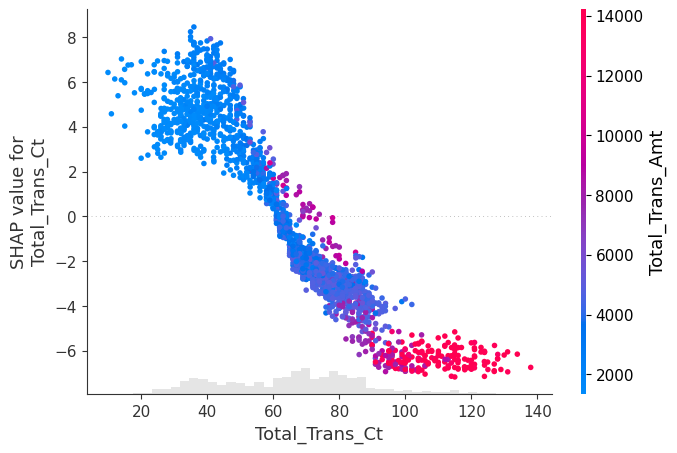

In [ ]:
# Dependence scatter plot to show the effect of a single feature across the whole dataset
shap.plots.scatter(shap_values[:, "Total_Trans_Ct"], color=shap_values)

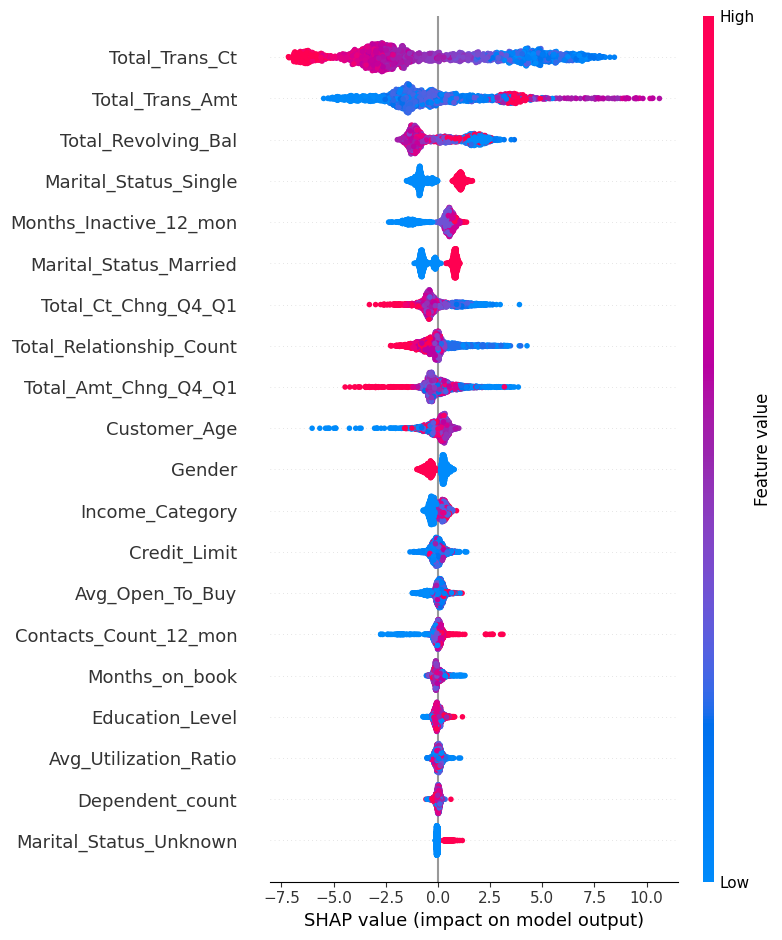

In [56]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X_test)